In [2]:
import os, sys
my_path = os.getcwd()+"/.."
print(my_path)
sys.path.append(my_path)
os.chdir(my_path)

import numpy as np
import matplotlib
from matplotlib import pyplot as plt
%matplotlib inline


#import ConveyorBelt as cb
from Ensembler.src.potentials.OneD import harmonicOsc
from Ensembler.src.potentials.ND import envelopedPotential
from Ensembler.src.integrator import monteCarloIntegrator, metropolisMonteCarloIntegrator
from Ensembler.src.integrator import positionVerletIntegrator, leapFrogIntegrator
from Ensembler.src.system import system

from Ensembler.visualisation.plotSimulations import static_sim_plots
from Ensembler.visualisation.animationSimulation import animation_trajectory, animation_EDS_trajectory


C:\Users\benja\OneDrive - ETHZ\PhD\Projects\code\Ensembler/..


# Plots of Simulations

## Stochastic Integrators

last_state:  State(position=array([-3.38427062]), temperature=298.0, totEnergy=5.726643799280745, totPotEnergy=5.726643799280745, totKinEnergy=0, dhdpos=array([-4.09]), velocity=None)
Trajectory length:  250


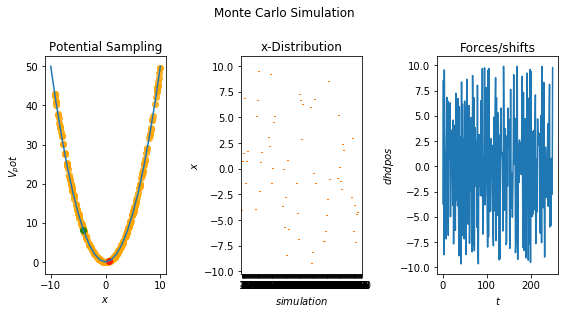

In [5]:
#Simple Monte Carlo simulation:
#settings
sim_steps = 250
x_min, x_max = (-10, 10)
max_step_size = 2.0
pot=harmonicOsc()
integrator = monteCarloIntegrator(spaceRange=[x_min, x_max])#maxStepSize=max_step_size,
sys=system(potential=pot, integrator=integrator)

#simulate
cur_state = sys.simulate(sim_steps, withdrawTraj=True)
print("last_state: ", cur_state)
print("Trajectory length: ",len(sys.trajectory))

#plot
static_sim_plots(sys, title="Monte Carlo Simulation", x_range=range(-10,11))

last_state:  State(position=array([-3.55]), temperature=298.0, totEnergy=6.3012500000000164, totPotEnergy=6.3012500000000164, totKinEnergy=0, dhdpos=array([-0.14]), velocity=None)
250


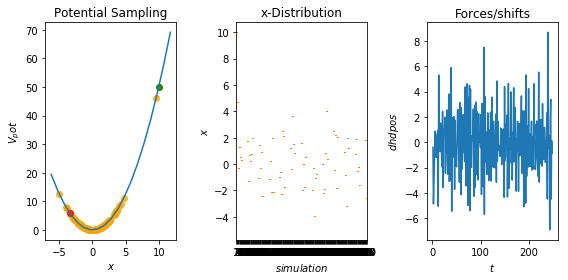

In [7]:
#Simple metropolis Monte Carlo simulation
#settings
sim_steps=250
#criterion= lambda ene_new, currentState: (ene_new < currentState.totPotEnergy)
x_min, x_max = (-10, 10)

pot=harmonicOsc()
integrator = metropolisMonteCarloIntegrator(spaceRange=[x_min, x_max])# metropolisCriterion=criterion (spaceRange=[min(x2), max(x2)], maxStepSize=max_step_size,
sys=system(potential=pot, integrator=integrator,  position=10)

#simulate
cur_state = sys.simulate(steps=sim_steps, withdrawTraj=True)
print("last_state: ", cur_state)
print(len(sys.trajectory))

#plot
static_sim_plots(sys, )

## Newtonian Integrator

### Position Verlet

In [8]:
#Simple Position Verlet integration simulation:

#settings
sim_steps = 250
x_min, x_max = (-10, 10)
max_step_size = 2.0
pot=harmonicOsc()
integrator = positionVerletIntegrator(dt=0.1)#maxStepSize=max_step_size,
sys=system(potential=pot, integrator=integrator, position=-8)

integrator.verbose= False
#simulate
print(sys._currentVelocities)
cur_state = sys.simulate(sim_steps, withdrawTraj=True, initSystem=False)
print("init_state", sys.trajectory[0], "\n")
print("last_state: ",  sys.trajectory[-1], "\n")
print("Trajectory length: ",len(sys.trajectory))
#plot
static_sim_plots(sys, title="position Verlet", x_range=range(-10,11))

None


TypeError: 'NoneType' object is not subscriptable

### Leap Frog

In [10]:
#Leap Frog integration simulation:

#settings
sim_steps = 250
x_min, x_max = (-10, 10)
max_step_size = 2.0
pot=harmonicOsc()
integrator = leapFrogIntegrator(dt=0.1)#maxStepSize=max_step_size,
sys=system(potential=pot, integrator=integrator, position=-8)

integrator.verbose= False
#simulate
sys._currentVelocities = 0
print(sys._currentVelocities)
cur_state = sys.simulate(sim_steps, withdrawTraj=True, initSystem=False)
print("init_state", sys.trajectory[0], "\n")
print("last_state: ",  sys.trajectory[-1], "\n")
print("Trajectory length: ",len(sys.trajectory))
#plot
static_sim_plots(sys, title="position Verlet", x_range=range(-10,11))

0


TypeError: cannot unpack non-iterable NoneType object

# Animations of Simulations

## Stochastic Integrators

## super  Monte Carlo Simulation:

200
<Ensembler.src.system.system object at 0x00000285539BFA58> [-10, 10]


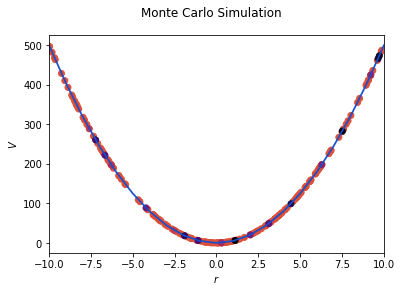

In [12]:
#settings
sim_steps = 200
space_range = [-10, 10]
pot=harmonicOsc(fc=10)
integrator = monteCarloIntegrator(spaceRange=space_range) #, maxStepSize=max_step_size,
sys=system(potential=pot, integrator=integrator,  position=10)

#simulate
cur_state = sys.simulate(sim_steps, withdrawTraj=True)
print(len(sys.trajectory))

#plot
print(sys, space_range)
ani, out_path = animation_trajectory(sys, x_range=space_range, title="Monte Carlo Simulation")

import tempfile
os.chdir(tempfile.gettempdir())
from IPython.display import HTML
HTML(ani.to_jshtml())

last_state:  State(position=array([-1.31446114]), temperature=298.0, totEnergy=1.7278080844619987, totPotEnergy=1.7278080844619987, totKinEnergy=0, dhdpos=array([0.63038463]), velocity=None)
200


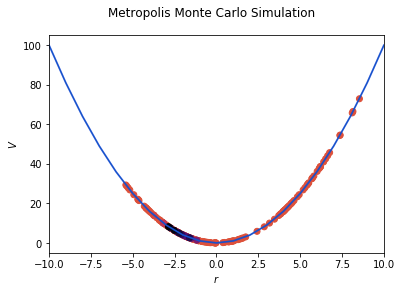

In [15]:
#super easy Metropolis_MonteCarlo simulation
#settings
space_range = [-10, 10]
sim_steps=200
pot=harmonicOsc(fc=2)
integrator = metropolisMonteCarloIntegrator(randomnessIncreaseFactor=5) 
sys=system(potential=pot, integrator=integrator,  position=9)

#simulate
cur_state = sys.simulate(sim_steps, withdrawTraj=True) #500000, withdrawTraj=True)
print("last_state: ", cur_state)
print(len(sys.trajectory))


#plot
ani, out_path = animation_trajectory(sys, x_range=space_range, title="Metropolis Monte Carlo Simulation")

##put it into jupyter:
import tempfile
os.chdir(tempfile.gettempdir())
from IPython.display import HTML
HTML(ani.to_jshtml())


In [ ]:
#Simple Verlet integration simulation:
#UNDER DEVELOPMENT!The temperature is not constant!!! -- BUGGY!
#settings
sim_steps = 200
x_min, x_max = (-10, 10)
max_step_size = 2.0
pot=harmonicOsc()
integrator = positionVerletIntegrator(dt=0.1)#maxStepSize=max_step_size,
sys=system(potential=pot, integrator=integrator, position=-7.5)
sys._currentVelocities = 0

#simulate
cur_state = sys.simulate(sim_steps, withdrawTraj=True, initSystem=False)
print("init_state", sys.trajectory[0], "\n")
print("last_state: ",  sys.trajectory[-1], "\n")
print("Trajectory length: ",len(sys.trajectory))

#animation
ani, out_path = animation_trajectory(sys, [x_min, x_max])

import tempfile
os.chdir(tempfile.gettempdir())
from IPython.display import HTML
HTML(ani.to_jshtml())

# EDS MMC sims

last_state:  State(position=array([1.58444352]), temperature=298.0, totEnergy=3.510461259615295, totPotEnergy=3.510461259615295, totKinEnergy=0, dhdpos=array([-0.90186853]), velocity=None)
32


TypeError: 'numpy.float64' object is not iterable

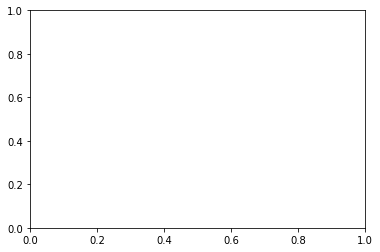

In [4]:
#Metropolis Monte Carlo Simulation for EDS
##Construct potential
fc=2
Eoffs=(0, 0, 0, 1, -1)
positions = [x / float(10) for x in range(-300, 301)]
V_is=[harmonicOsc(x_shift=-20, fc=fc), harmonicOsc(x_shift=20, fc=fc),
      harmonicOsc(x_shift=10, fc=fc), harmonicOsc(x_shift=-10, fc=fc), harmonicOsc(x_shift=0, fc=fc)]
eds_pot = envelopedPotential(V_is=V_is, s=1.0, Eoff_i=Eoffs)

#Build System
integrator = metropolisMonteCarloIntegrator() 
sys=system(potential=eds_pot, integrator=integrator) #,  position=20)
del sys.trajectory[:]


#simulate
values = [1.0, 0.09, 0.07,  0.05, 0.04, 0.03, 0.02, 0.01]
each_sim = 2
svals = values+list(reversed(values))
for s in svals*1:
    sys.potential.s = s
    cur_state = sys.simulate(each_sim, withdrawTraj=False)
print("last_state: ", cur_state)
print(len(sys.trajectory))


import tempfile
tmp_dir = tempfile.gettempdir()
os.chdir(tmp_dir)


#animation
ani, out_path = animation_EDS_trajectory(sys, [min(positions),max(positions)], s_values=list(set(svals)), step_size=300)
print(tmp_dir)

from IPython.display import HTML
HTML(ani.to_jshtml())


[[-272.85714207]] [[-14.97130727]]
[[-272.85714207]] [[-14.97130727]]
[[-225.9219425]] [[-5.67196788]]
[[-225.9219425]] [[-5.67196788]]
[[-2.72857142]] [[-0.14971307]]
[[-2.93756738]] [[-0.20162097]]
[[-2.97456639]] [[-0.21139955]]
[[-2.46095008]] [[-0.09231297]]
[[-2.46095008]] [[-0.09231297]]
[[-2.72857142]] [[-0.14971307]]
[[-2.37055761]] [[-0.07548782]]
[[-2.37055761]] [[-0.07548782]]
[[-272.85714207]] [[-14.97130727]]
[[-301.43853766]] [[-22.21118867]]
[[-224.59734541]] [[-5.4637264]]
[[-224.59734541]] [[-5.4637264]]
last_state:  State(position=array([-5.47834048]), temperature=298.0, totEnergy=5.4637264014786275, totPotEnergy=5.4637264014786275, totKinEnergy=0, dhdpos=array([0.96880539]), velocity=None)
4
[[-4.90000000e+02 -4.82640906e+02 -4.75337491e+02 -4.68089758e+02
  -4.60897705e+02 -4.53761332e+02 -4.46680639e+02 -4.39655627e+02
  -4.32686296e+02 -4.25772645e+02 -4.18914674e+02 -4.12112384e+02
  -4.05365774e+02 -3.98674844e+02 -3.92039595e+02 -3.85460026e+02
  -3.78936138e+

ValueError: x and y must have same first dimension, but have shapes (200,) and (1, 200)

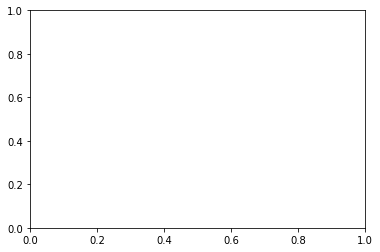

In [5]:
#Metropolis Monte Carlo Simulation for EDS
##Construct potential
fc=5
Eoffs=(0, 0)
V_is=[harmonicOsc(x_shift=4, fc=fc), harmonicOsc(x_shift=-4, fc=fc)]
eds_pot = envelopedPotential(V_is=V_is, s=1.0, Eoff_i=Eoffs)

#Build System
integrator = metropolisMonteCarloIntegrator() 
sys=system(potential=eds_pot, integrator=integrator) #,  position=20)
del sys.trajectory[:]


#simulate
values = [1.0,  0.01]
svals = values+list(reversed(values))
each_sim = 1
for s in svals*1:
    sys.potential.s = s
    cur_state = sys.simulate(each_sim, withdrawTraj=False)
print("last_state: ", cur_state)
print(len(sys.trajectory))



import tempfile
tmp_dir = tempfile.gettempdir()
os.chdir(tmp_dir)


#animation
tmp_dir = "/home/bschroed"
out_path=tmp_dir+"/harmOsc.mp4"
out_path = None
#matplotlib.rcParams['animation.embed_limit'] = 20971520*3#if three is not enough storage

ani, out_path = animation_EDS_trajectory(sys, x_range=[-10,10], 
                                         s_values=list(set(svals)), step_size=10, 
                                         out_path=out_path,  tot_pot_resolution=200)
print(tmp_dir)

from IPython.display import HTML
HTML(ani.to_jshtml())



In [ ]:
#Metropolis Monte Carlo Simulation for EDS
##Construct potential
fc=5
Eoffs=(0, 0)
V_is=[harmonicOsc(x_shift=4, fc=fc), harmonicOsc1D(x_shift=-4, fc=fc)]
eds_pot = envelopedPotential(V_is=V_is, s=1.0, Eoff_i=Eoffs)

#Build System
integrator = metropolisMonteCarloIntegrator() 
sys=system(potential=eds_pot, integrator=integrator) #,  position=20)
del sys.trajectory[:]


#simulate
values = [1.0,  0.05, 0.03, 0.0125, 0.01]
svals = values+list(reversed(values))
each_sim = 200
for s in svals*3:
    sys.potential.s = s
    cur_state = sys.simulate(each_sim, withdrawTraj=False)
print("last_state: ", cur_state)
print(len(sys.trajectory))



import tempfile
tmp_dir = tempfile.gettempdir()
os.chdir(tmp_dir)


#animation
tmp_dir = "/home/bschroed"
out_path=tmp_dir+"/harmOsc.mp4"
out_path = None

ani, out_path = animation_EDS_trajectory(sys, x_range=[-10,10], 
                                         s_values=list(set(svals)), step_size=10, 
                                         out_path=out_path, out_writer="ffmpeg", dpi=600, tot_pot_resolution=1000)
print(tmp_dir)

from IPython.display import HTML
HTML(ani.to_jshtml())

In [ ]:
#Newton Simulation for EDS
##Construct potential
fc=20
Eoffs=(0, 0)
V_is=[harmonicOsc1D(x_shift=7, fc=fc), harmonicOsc1D(x_shift=-7, fc=fc)]
eds_pot = envelopedPotential(V_is=V_is, s=1.0, Eoff_i=Eoffs)

#Build System
integrator = positionVerletIntegrator(dt=1)#maxStepSize=max_step_size,
sys=system(potential=eds_pot, integrator=integrator) #,  position=20)
del sys.trajectory[:]


#simulate
values = [1.0, 0.001]
svals = values+list(reversed(values))
for s in svals*4:
    sys.potential.s = s
    cur_state = sys.simulate(200, withdrawTraj=False)
print("last_state: ", cur_state)
print(len(sys.trajectory))



import tempfile
tmp_dir = tempfile.gettempdir()
os.chdir(tmp_dir)


#animation
tmp_dir = "/home/bschroed"
out_path=tmp_dir+"/harmOsc.mp4"
out_path = None

ani, out_path = animation_EDS_trajectory(sys, x_range=[-10,10], s_values=list(set(svals)), step_size=1)

from IPython.display import HTML
HTML(ani.to_jshtml())

